# AI Based Wallpaper Generator

## Deep Learning Project
#### Project Members:
1. Aaryan Babuta [A1-02]
2. Aditya Arvikar [A3-37]





#### Install Dependencies

In [27]:
!pip install transformers gradio accelerate peft bitsandbytes xformers

In [28]:
# INSTALL the latest development version from GitHub
!pip install git+https://github.com/huggingface/diffusers

  Cloning https://github.com/huggingface/diffusers to /tmp/pip-req-build-3kn99d_x
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/diffusers /tmp/pip-req-build-3kn99d_x
  Resolved https://github.com/huggingface/diffusers to commit 5b27f8aba8139065f81f0dfec1cd876a3daefda6
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [29]:
!wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora.py

--2025-04-09 18:13:06--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 58435 (57K) [text/plain]
Saving to: ‘train_dreambooth_lora.py’

train_dreambooth_lo 100%[===================>]  57.07K  --.-KB/s    in 0.009s  

2025-04-09 18:13:06 (6.08 MB/s) - ‘train_dreambooth_lora.py’ saved [58435/58435]



#### Import Required Libraries

In [ ]:
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt
import torch

#### Intialize the Model

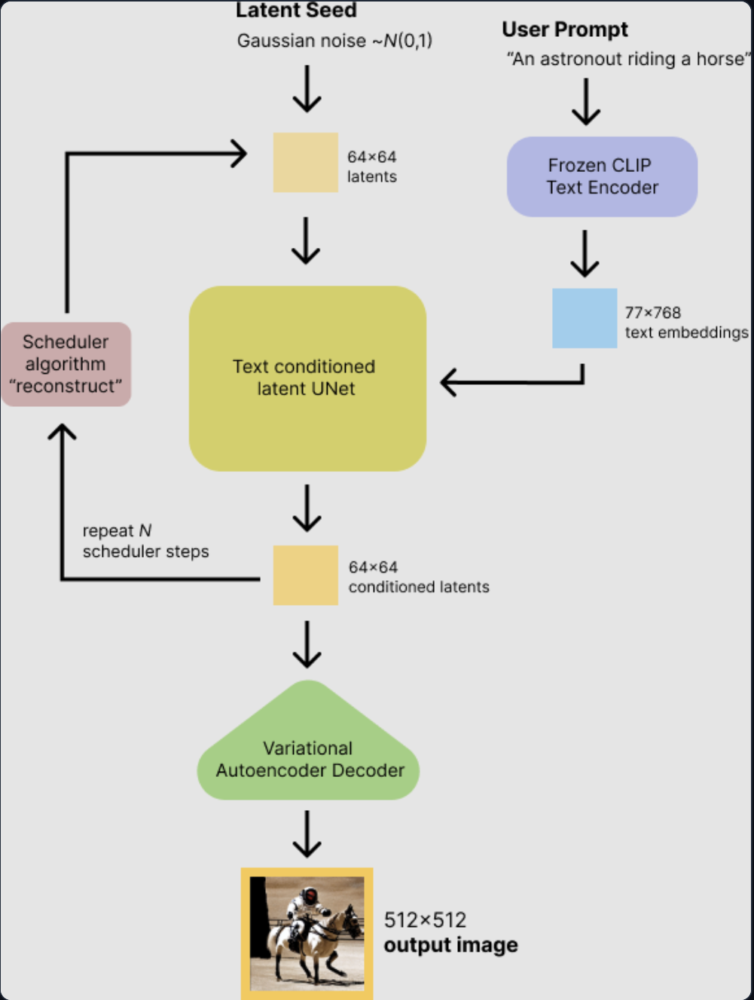

In [6]:
model = "stabilityai/stable-diffusion-2-1"

In [7]:
pipe = StableDiffusionPipeline.from_pretrained(model, torch_dtype=torch.float16, use_safetensors = True)
pipe = pipe.to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

#### Test Prompt 1

In [8]:
prompt = """Mountains touching the skys, covered with snow and shinning in the sunlight"""
gen_img = pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

[PROMPT]:  Mountains touching the skys, covered with snow and shinning in the sunlight


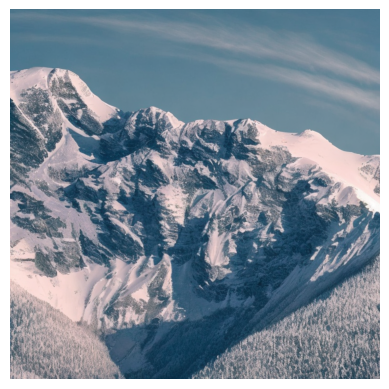

In [9]:
print("[PROMPT]: ",prompt)
plt.imshow(gen_img);
plt.axis('off');

#### Test Prompt 2

In [10]:
prompt = """Evergreen dense forest, with sun shines bright after the rain."""
gen_img = pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

[PROMPT]:  Evergreen dense forest, with sun shines bright after the rain.


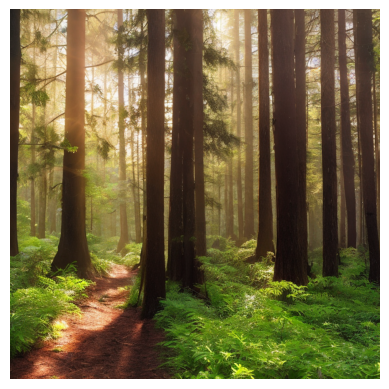

In [11]:
print("[PROMPT]: ",prompt)
plt.imshow(gen_img);
plt.axis('off');

#### User Defined Function to Generate and View Images

In [17]:
def gen_wallpaper(pipe, prompt, params):
  img = pipe(prompt, **params).images

  num_wallpapers = len(img)
  if num_wallpapers > 1:
    fig, ax = plt.subplots(nrows = 1, ncols = num_wallpapers)
    for i in range(num_wallpapers):
      ax[i].imshow(img[i])
      ax[i].axis('off')
  else:
    fig = plt.figure()
    plt.imshow(img[0])
    plt.axis('off')
  plt.tight_layout()

#### Stable Diffusion Parameters
> *   Negative Prompting
*   Number of inference steps
*   Height
*   Width
*   Number of images per prompt

  0%|          | 0/100 [00:00<?, ?it/s]

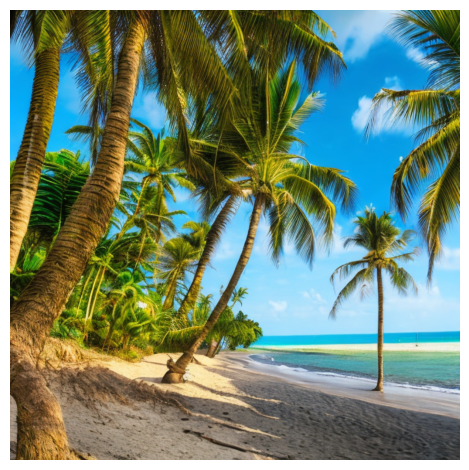

In [18]:
prompt = """Beach with a couple of coconut tress and palm trees in a bright sunny day"""
#num inference steps
params = {"num_inference_steps": 100}
gen_wallpaper(pipe, prompt, params)

  0%|          | 0/50 [00:00<?, ?it/s]

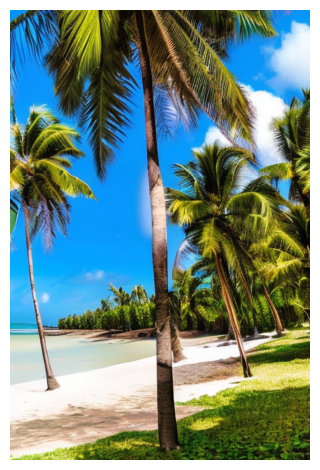

In [19]:
# height and width
params = {"num_inference_steps": 50, "width" : 512, "height" : 768}
gen_wallpaper(pipe, prompt, params)

  0%|          | 0/100 [00:00<?, ?it/s]

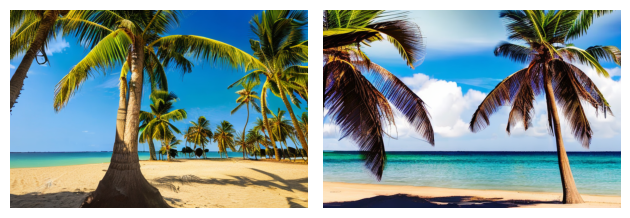

In [20]:
# number of images
params = {"num_inference_steps": 100, "num_images_per_prompt": 2, "width" : 768, "height" : 512}
gen_wallpaper(pipe, prompt, params)

#### Using Unsplash API to import Image Dataset

In [ ]:
import requests

UNSPLASH_ACCESS_KEY = "*******"
url = "https://api.unsplash.com/photos/random"
headers = {"Authorization": f"Client-ID {UNSPLASH_ACCESS_KEY}"}
response = requests.get(url, headers=headers)

print(response.status_code)
print(response.json())

200
{'id': 'g2fvtB8qNlg', 'slug': 'a-modern-building-with-a-teal-garage-door-g2fvtB8qNlg', 'alternative_slugs': {'en': 'a-modern-building-with-a-teal-garage-door-g2fvtB8qNlg', 'es': 'un-edificio-moderno-con-una-puerta-de-garaje-verde-azulado-g2fvtB8qNlg', 'ja': 'ティール色のガレージドアを備えたモダンな建物-g2fvtB8qNlg', 'fr': 'un-batiment-moderne-avec-une-porte-de-garage-turquoise-g2fvtB8qNlg', 'it': 'un-edificio-moderno-con-una-porta-del-garage-verde-acqua-g2fvtB8qNlg', 'ko': '청록색-차고-문이-있는-현대적인-건물입니다-g2fvtB8qNlg', 'de': 'ein-modernes-gebaude-mit-einem-blaugrunen-garagentor-g2fvtB8qNlg', 'pt': 'um-edificio-moderno-com-uma-porta-de-garagem-azul-petroleo-g2fvtB8qNlg'}, 'created_at': '2025-03-23T07:45:59Z', 'updated_at': '2025-04-09T14:43:47Z', 'promoted_at': None, 'width': 3024, 'height': 3771, 'color': '#c0a68c', 'blur_hash': 'LFHeB;xZ-n%1}?ayNGs.ERs.IpRj', 'description': 'Shot on iPhone 15 Pro.', 'alt_description': 'A modern building with a teal garage door.', 'breadcrumbs': [], 'urls': {'raw': 'https://ima

In [ ]:
import os
import requests

# ====== CONFIG ======
UNSPLASH_ACCESS_KEY = "*******"
COLLECTION_ID = "vg8NlXlrxyY"  # Replace with your collection ID
NUM_IMAGES = 40           # Max per API call = 50
SAVE_DIR = "wallpapers_from_collection"
IMAGE_SIZE = "full"       # Options: raw, full, regular, small, thumb

# ====== SETUP ======
os.makedirs(SAVE_DIR, exist_ok=True)

# ====== FETCH & DOWNLOAD ======
url = f"https://api.unsplash.com/collections/{COLLECTION_ID}/photos?per_page={NUM_IMAGES}"
headers = {"Authorization": f"Client-ID {UNSPLASH_ACCESS_KEY}"}
response = requests.get(url, headers=headers)

if response.status_code == 200:
    data = response.json()
    for i, photo in enumerate(data):
        img_url = photo['urls'][IMAGE_SIZE]
        img_data = requests.get(img_url).content
        filename = f"{SAVE_DIR}/wallpaper_{i+1}.jpg"
        with open(filename, "wb") as f:
            f.write(img_data)
        print(f"Downloaded: {filename}")
else:
    print("Failed to fetch images:", response.status_code, response.text)

Downloaded: wallpapers_from_collection/wallpaper_1.jpg
Downloaded: wallpapers_from_collection/wallpaper_2.jpg
Downloaded: wallpapers_from_collection/wallpaper_3.jpg
Downloaded: wallpapers_from_collection/wallpaper_4.jpg
Downloaded: wallpapers_from_collection/wallpaper_5.jpg
Downloaded: wallpapers_from_collection/wallpaper_6.jpg
Downloaded: wallpapers_from_collection/wallpaper_7.jpg
Downloaded: wallpapers_from_collection/wallpaper_8.jpg
Downloaded: wallpapers_from_collection/wallpaper_9.jpg
Downloaded: wallpapers_from_collection/wallpaper_10.jpg
Downloaded: wallpapers_from_collection/wallpaper_11.jpg
Downloaded: wallpapers_from_collection/wallpaper_12.jpg
Downloaded: wallpapers_from_collection/wallpaper_13.jpg
Downloaded: wallpapers_from_collection/wallpaper_14.jpg
Downloaded: wallpapers_from_collection/wallpaper_15.jpg
Downloaded: wallpapers_from_collection/wallpaper_16.jpg
Downloaded: wallpapers_from_collection/wallpaper_17.jpg
Downloaded: wallpapers_from_collection/wallpaper_18.jpg
D

#### Fine Tune the model

In [23]:
pretrained_model = "stabilityai/stable-diffusion-2-1"
dataset_dir = "./wallpapers_from_collection"
output_dir = "./dreambooth_wallpaper_model"

instance_prompt = "a photo of space wallpaper"  # 'space' is your custom token
class_prompt = "a photo of a wallpaper"

In [24]:
# If you're running multiple sessions or rerunning code:
import gc
gc.collect()
torch.cuda.empty_cache()

In [30]:
!accelerate launch train_dreambooth_lora.py \
  --pretrained_model_name_or_path=stabilityai/stable-diffusion-2-1 \
  --instance_data_dir=/content/wallpapers_from_collection \
  --output_dir=./dreambooth_wallpaper_lora \
  --instance_prompt="a photo of space wallpaper" \
  --resolution=512 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=1 \
  --learning_rate=1e-4 \
  --lr_scheduler=constant \
  --max_train_steps=500 \
  --checkpointing_steps=100 \
  --validation_prompt="a photo of space wallpaper" \
  --seed=1337 \
  --report_to=tensorboard \
  --gradient_checkpointing \
  --train_text_encoder

The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2025-04-09 18:13:29.191444: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744222409.219792    7442 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744222409.229117    7442 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
04/09/2025 18:13:34 - INFO - __main__ - Distributed en

#### View loss through tensorboard

In [31]:
%load_ext tensorboard
%tensorboard --logdir ./dreambooth_wallpaper_lora

<IPython.core.display.Javascript object>

#### Testing the generated Images

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/diffusers/loaders/unet.py:212: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


  0%|          | 0/50 [00:00<?, ?it/s]

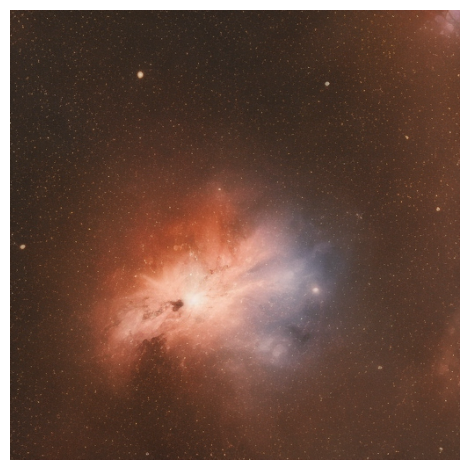

In [32]:
pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1",torch_dtype=torch.float16,).to("cuda")

# Load LoRA weights
pipe.unet.load_attn_procs("./dreambooth_wallpaper_lora")

# Generate
gen_wallpaper(pipe, prompt = """a photo of space wallpaper""", params = {"num_inference_steps": 50, "num_images_per_prompt": 1, "width" : 512, "height" : 512})

#### Gradio Based UI

In [35]:
import gradio as gr
def infer(prompt):
    image = pipe(prompt, height=1080, width=1920).images[0] #general size of a 15inch windows laptop
    return image

In [ ]:
gr.Interface(fn=infer, inputs="text", outputs="image", title="AI Image Generator").launch()